In [1]:
import pyro
import torch
import argparse
import numpy as np
import matplotlib.pyplot as plt
import graphviz

from pyrocov.mutrans import model, load_jhu_data
from scripts.mutrans import load_data

In [2]:
parser = argparse.ArgumentParser(description="Fit mutation-transmissibility models")
parser.add_argument("--vary-model-type", help="comma delimited list of model types")
parser.add_argument("--vary-guide-type", help="comma delimited list of guide types")
parser.add_argument("--vary-num-steps", help="comma delimited list of num_steps")
parser.add_argument("--vary-coef-scale", help="comma delimited list of coef_scale")
parser.add_argument("--vary-holdout", action="store_true")
parser.add_argument("--vary-leaves", action="store_true")
parser.add_argument("--vary-gene", action="store_true")
parser.add_argument("--vary-nsp", action="store_true")
parser.add_argument("--gisaid", action="store_true", default=False)
parser.add_argument("--max-num-clades", default=3000, type=int)
parser.add_argument("--min-num-mutations", default=1, type=int)
parser.add_argument("--min-region-size", default=50, type=int)
parser.add_argument("-cd", "--cond-data", default="coef_scale=0.05")
parser.add_argument("-m", "--model-type", default="reparam-localinit")
parser.add_argument("-g", "--guide-type", default="full")
parser.add_argument("-n", "--num-steps", default=10001, type=int)
parser.add_argument("-s", "--num-samples", default=1000, type=int)
parser.add_argument("-lr", "--learning-rate", default=0.05, type=float)
parser.add_argument("-lrd", "--learning-rate-decay", default=0.1, type=float)
parser.add_argument("-cn", "--clip-norm", default=10.0, type=float)
parser.add_argument("-r", "--rank", default=200, type=int)
parser.add_argument("-f", "--forecast-steps", default=6)
parser.add_argument("-fp64", "--double", action="store_true")
parser.add_argument("-fp32", "--float", action="store_false", dest="double")
parser.add_argument(
       "--cuda", action="store_true", default=torch.cuda.is_available()
)
parser.add_argument("-b", "--backtesting-max-day", default=None)
parser.add_argument("--cpu", dest="cuda", action="store_false")
parser.add_argument("--jit", action="store_true", default=False)
parser.add_argument("--no-jit", dest="jit", action="store_false")
parser.add_argument("--seed", default=20210319, type=int)
parser.add_argument("-l", "--log-every", default=100, type=int)
parser.add_argument("--no-new", action="store_true")
parser.add_argument("--no-cache", action="store_true")
parser.add_argument("--force", action="store_true")
parser.add_argument("--test", action="store_true")
parser.add_argument("--debug", action="store_true")
args = parser.parse_args()
args.device = "cuda" if args.cuda else "cpu"

In [3]:
dataset=load_data(args)

     5163 loading cached results/mutrans.data.single.3000.1.50.None.pt


In [4]:
dataset.keys()
for key in dataset.keys():
    print("Key: {}".format(key))
    print("Len dataset[{key}]: {len}".format(key=key, len=len(dataset[key])))
    print()        
        

Key: clade_id
Len dataset[clade_id]: 3000

Key: clade_id_inv
Len dataset[clade_id_inv]: 3000

Key: clade_id_to_lineage_id
Len dataset[clade_id_to_lineage_id]: 3000

Key: clade_to_lineage
Len dataset[clade_to_lineage]: 3000

Key: features
Len dataset[features]: 3000

Key: lineage_id
Len dataset[lineage_id]: 1862

Key: lineage_id_inv
Len dataset[lineage_id_inv]: 1862

Key: lineage_id_to_clade_id
Len dataset[lineage_id_to_clade_id]: 1862

Key: lineage_to_clade
Len dataset[lineage_to_clade]: 1862

Key: location_id
Len dataset[location_id]: 1900

Key: location_id_inv
Len dataset[location_id_inv]: 1900

Key: mutations
Len dataset[mutations]: 2984

Key: pc_index
Len dataset[pc_index]: 254067

Key: sparse_counts
Len dataset[sparse_counts]: 3

Key: state_to_country
Len dataset[state_to_country]: 1685

Key: time
Len dataset[time]: 70

Key: weekly_clades
Len dataset[weekly_clades]: 70



In [74]:
print(dataset["sparse_counts"]["index"][:,:10].T)
print()
print()
print(dataset["sparse_counts"]["value"][:10])
print()
print()
print(dataset["weekly_clades"][1,1889,0])
print(dataset["weekly_clades"][2,7,0])
print(dataset["weekly_clades"][2,7,49])
print(dataset["weekly_clades"][2,10,0])
print(dataset["weekly_clades"][2,10,57])
print(dataset["weekly_clades"][2,67,354])
print(dataset["weekly_clades"][2,103,191])
print(dataset["weekly_clades"][2,103,346])
print(dataset["weekly_clades"][2,103,615])
print(dataset["weekly_clades"][2,103,707])

tensor([[   1, 1889,    0],
        [   2,    7,    0],
        [   2,    7,   49],
        [   2,   10,    0],
        [   2,   10,   57],
        [   2,   67,  354],
        [   2,  103,  191],
        [   2,  103,  346],
        [   2,  103,  615],
        [   2,  103,  707]])


tensor([ 3.,  5.,  1.,  4.,  2.,  1., 20.,  1.,  1.,  3.])


tensor(3.)
tensor(5.)
tensor(1.)
tensor(4.)
tensor(2.)
tensor(1.)
tensor(20.)
tensor(1.)
tensor(1.)
tensor(3.)


In [76]:
for i in range(70):
    for j in range(1):
        if dataset["sparse_counts"]["total"][i][j] != 0:
            print(i,j)
print(dataset["sparse_counts"]["total"][28][0])
print(dataset["sparse_counts"]["total"][29][0])
print(dataset["sparse_counts"]["total"][41][0])
print(dataset["sparse_counts"]["total"][42][0])
print(dataset["sparse_counts"]["total"][44][0])
print(dataset["sparse_counts"]["total"][45][0])
print(dataset["sparse_counts"]["total"][49][0])
print()
print(torch.sum(dataset["weekly_clades"][28][0]))
print(torch.sum(dataset["weekly_clades"][29][0]))
print(torch.sum(dataset["weekly_clades"][41][0]))
print(torch.sum(dataset["weekly_clades"][42][0]))
print(torch.sum(dataset["weekly_clades"][44][0]))
print(torch.sum(dataset["weekly_clades"][45][0]))
print(torch.sum(dataset["weekly_clades"][49][0]))


28 0
29 0
41 0
42 0
44 0
45 0
49 0
tensor(7.)
tensor(2.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(4.)
tensor(6.)

tensor(7.)
tensor(2.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(4.)
tensor(6.)


In [81]:
print(len(dataset["pc_index"]))
print(dataset["sparse_counts"]["index"].shape)

254067
torch.Size([3, 864902])


In [92]:
x = torch.tensor([[0, 0, 0, 1, 0],[0,0,0,0,0],[1,0,0,1,0]])
x.ne(0).any(0).nonzero(as_tupl

tensor([ True, False, False,  True, False])

In [93]:
print(len(dataset["sparse_counts"]["index"][0]))
print(len(dataset["sparse_counts"]["value"]))
print(len(dataset["sparse_counts"]["total"]))
print(len(dataset["sparse_counts"]["total"][0]))

864902
864902
70
1900


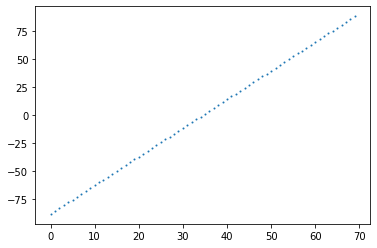

In [123]:
plt.plot(dataset["time"], "o", ms=1)

In [8]:
print(len(dataset["weekly_clades"]))
print(len(dataset["weekly_clades"][0]))
print(len(dataset["weekly_clades"][0][0]))
print(torch.max(dataset["weekly_clades"][2]))

70
1900
3000
tensor(21.)


In [185]:
!pip install graphviz

     |████████████████████████████████| 47 kB 3.6 MB/s eta 0:00:011


In [4]:
fits = torch.load("results/mutrans.pt", map_location="cpu")

In [5]:
for key in fits.keys():
    print(key)

('coef_scale=0.05', 'reparam-localinit', 'full', 10001, 0.05, 0.1, 10.0, 200, 6, None, ())


In [6]:
fits_info=list(fits.values())[0]
fits_info.keys()

dict_keys(['median', 'mean', 'std', 'ELL', 'losses', 'series', 'params', 'walltime', 'args', 'mutations', 'weekly_clades', 'weekly_cases', 'weekly_clades_shape', 'location_id', 'clade_id_inv', 'clade_to_lineage', 'lineage_to_clade', 'location_id_inv', 'lineage_id_inv'])

In [11]:
fits_info["weekly_clades"].shape

torch.Size([70, 1900, 3000])

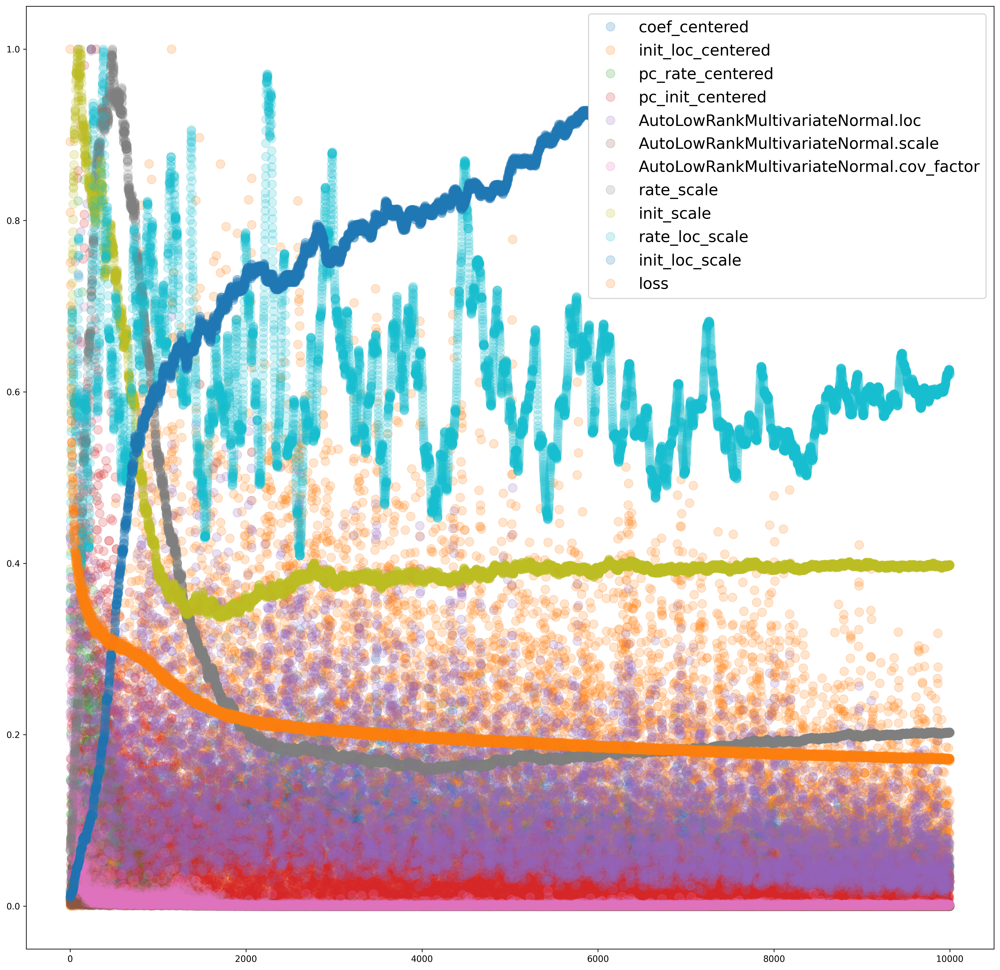

In [173]:
fig, ax = plt.subplots(1,1, figsize=(20,20), dpi=300)
for var in fits_info["series"].keys():
    x = fits_info["series"][var]
    x = [X / max(x) for X in x]
    ax.plot(x, "o", alpha=0.2, ms=10)

plt.legend(fits_info["series"].keys(), loc="upper right", fontsize=18, framealpha=1)
plt.show()

In [185]:
len(fits_info["clade_id_inv"])

3000

In [10]:
len(dataset["features"][0])

2984